# **Chapter 10**

# **Image Segmentation: From Classical Methods to Deep Learning**

---


## **Part I — Classical Image Segmentation**
---


### **1. Threshold-Based Segmentation**

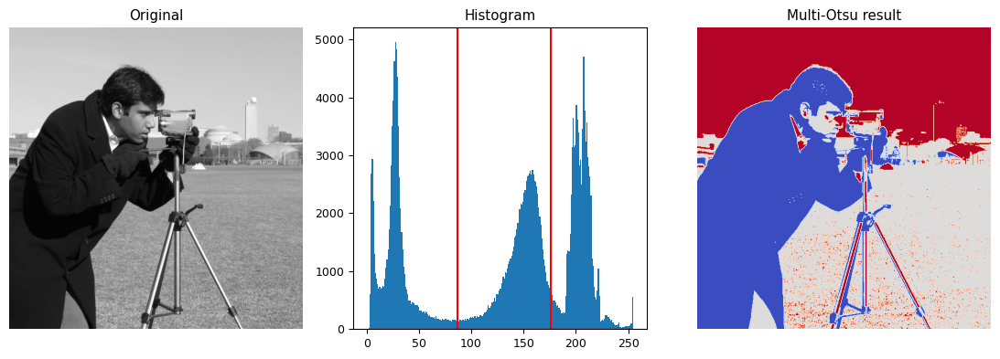

In [4]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from skimage import data
from skimage.filters import threshold_multiotsu

# Setting the font size for all plots.
matplotlib.rcParams['font.size'] = 9

# Loads the classic grayscale **camera image** (512×512): Pixel intensities range from 0–255.
image = data.camera()

# Applying multi-Otsu threshold for the default value, generating three classes.
thresholds = threshold_multiotsu(image)

# Using the threshold values, we generate the three regions.
regions = np.digitize(image, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(11, 4))

# Plotting the original image.
ax[0].imshow(image, cmap='gray', aspect='auto')
ax[0].set_title('Original')
ax[0].axis('off')

# Plotting the histogram and the two thresholds obtained from multi-Otsu.
ax[1].hist(image.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')

# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='coolwarm', aspect='auto')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')

plt.tight_layout()
plt.show()

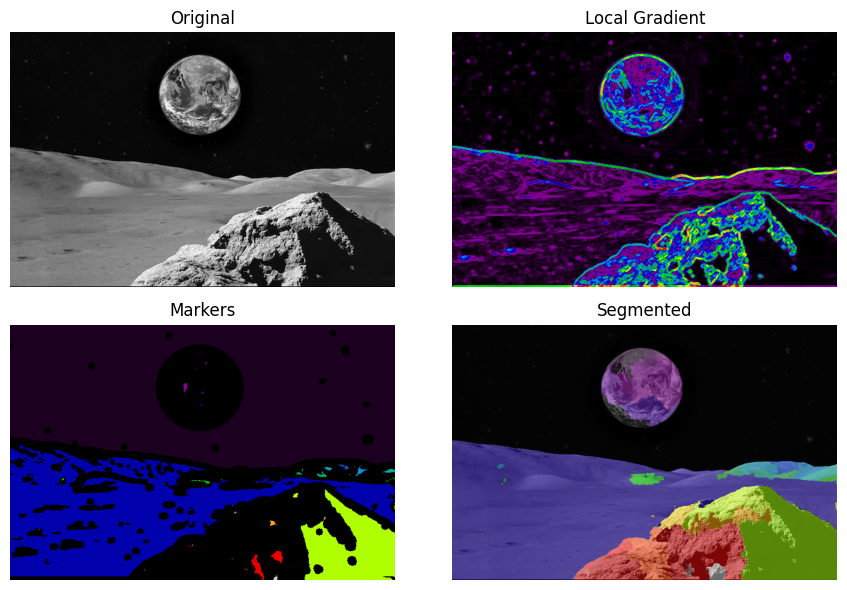

In [6]:
from scipy import ndimage as ndi
from skimage.morphology import disk
from skimage.segmentation import watershed
from skimage.util import img_as_ubyte
from skimage.filters import rank
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt

image = img_as_ubyte(rgb2gray(imread('images/earth.png')[...,:3]))
# denoise image
denoised = rank.median(image, disk(2))
# find continuous region (low gradient -
# where less than 20 for this image) --> markers
# disk(5) is used here to get a more smooth image
markers = rank.gradient(denoised, disk(5)) < 20 # threshold
markers = ndi.label(markers)[0]
# local gradient (disk(2) is used to keep edges thin)
gradient = rank.gradient(denoised, disk(2))
# process the watershed
labels = watershed(gradient, markers)

# display results
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 6), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title("Original")
ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral)
ax[1].set_title("Local Gradient")
ax[2].imshow(markers, cmap=plt.cm.nipy_spectral)
ax[2].set_title("Markers")
ax[3].imshow(image, cmap=plt.cm.gray)
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, alpha=0.5)
ax[3].set_title("Segmented")
for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

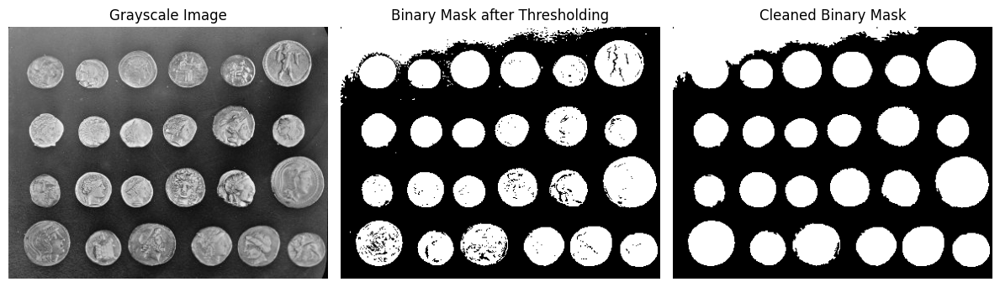

In [4]:
from skimage import io, color, filters, measure, morphology
from scipy import ndimage as ndi

# Load image
gray = data.coins()

# Otsu's thresholding
thresh = filters.threshold_otsu(gray)
binary = gray > thresh

### Morphological Cleaning
# Remove small objects
cleaned = morphology.remove_small_objects(binary, min_size=100)
# Fill small holes
cleaned = ndi.binary_fill_holes(cleaned)

plt.figure(figsize=(12,6))
plt.gray()
plt.subplot(131), plt.imshow(gray), plt.title("Grayscale Image"), plt.axis('off')
plt.subplot(132), plt.imshow(binary), plt.title("Binary Mask after Thresholding"), plt.axis('off')
plt.subplot(133), plt.imshow(cleaned), plt.title("Cleaned Binary Mask"), plt.axis('off')
plt.tight_layout()
plt.show()

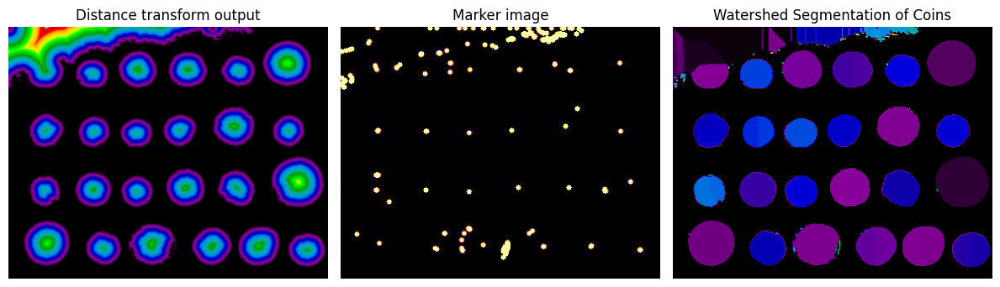

In [29]:
### Distance Transform and Watershed
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage import measure

# Compute distance transform
distance = ndi.distance_transform_edt(cleaned)

# Find local maxima coordinates
coords = peak_local_max(
    distance,
    footprint=np.ones((3, 3)),
    labels=cleaned
)

# Create marker image
markers = np.zeros_like(distance, dtype=int)
for i, (r, c) in enumerate(coords, start=1):
    markers[r, c] = i

# Apply watershed
labels = watershed(-distance, markers, mask=cleaned)

plt.figure(figsize=(12,6))
plt.subplot(131), plt.imshow(distance, cmap='nipy_spectral'), plt.title("Distance transform output"), plt.axis('off')
plt.subplot(132), plt.imshow(morphology.dilation(markers > 0, morphology.disk(3)), cmap='inferno'), plt.title("Marker image"), plt.axis('off')
plt.subplot(133), plt.imshow(labels, cmap='nipy_spectral'), plt.title("Watershed Segmentation of Coins"), plt.axis('off')
plt.tight_layout()
plt.show()

Number of coins detected: 24


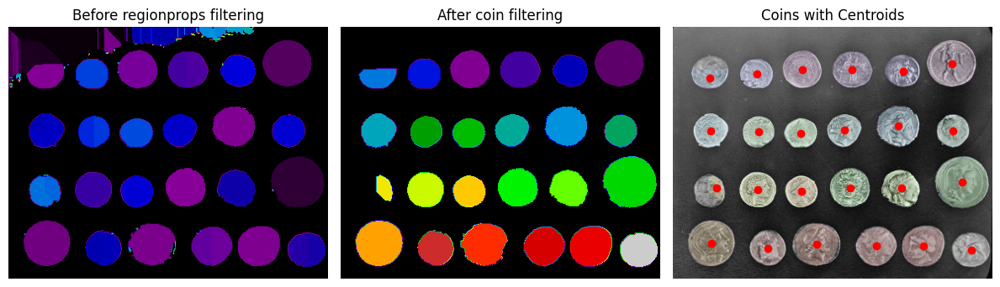

In [39]:
MIN_AREA = 200
MAX_AREA = 5000
MAX_ECCENTRICITY = 0.75     # 0 = circle, 1 = line
MIN_SOLIDITY = 0.85
MIN_EXTENT = 0.6

regions = measure.regionprops(labels)
coin_labels = []

for region in regions:
    circularity = 4 * np.pi * region.area / (region.perimeter ** 2 + 1e-6)
    if circularity > 0.7 and region.area > MIN_AREA:
        coin_labels.append(region.label)

coin_mask = np.isin(labels, coin_labels)
clean_labels = measure.label(coin_mask)
num_coins = clean_labels.max()
print(f"Number of coins detected: {num_coins}")

regions = measure.regionprops(clean_labels)

plt.figure(figsize=(12,5))
plt.subplot(131), plt.imshow(labels, cmap='nipy_spectral'), plt.title("Before regionprops filtering"), plt.axis('off')
plt.subplot(132), plt.imshow(clean_labels, cmap='nipy_spectral'), plt.title("After coin filtering"), plt.axis('off')
plt.subplot(133), plt.imshow(gray, cmap='gray'), plt.imshow(clean_labels, cmap='nipy_spectral', alpha=0.1)
for region in regions:
    y, x = region.centroid
    plt.plot(x, y, 'ro')  # Red dot at centroid
plt.title("Coins with Centroids"), plt.axis('off')
plt.tight_layout()
plt.show()

### **3. Superpixel-Based Segmentation**

#### **3.1 SLIC vs MaskSLIC**

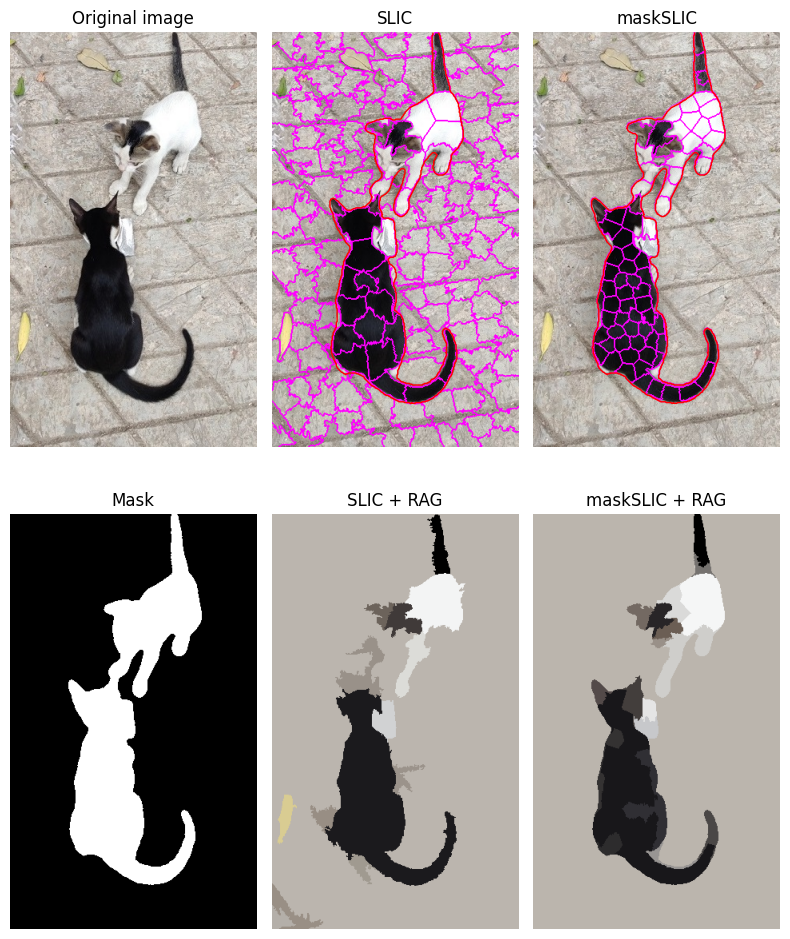

In [12]:
from skimage import data, color, morphology, segmentation
from skimage import graph

# RAG MERGING
def _weight_mean_color(graph, src, dst, n):
    """Compute new weight after merging nodes."""
    diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
    diff = np.linalg.norm(diff)
    return {'weight': diff}


def merge_mean_color(graph, src, dst):
    """Update node attributes after merging."""
    graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
    graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
    graph.nodes[dst]['mean color'] = (
        graph.nodes[dst]['total color'] / graph.nodes[dst]['pixel count']
    )

def merge_segments(img, segments):

    rag = graph.rag_mean_color(img, segments)

    labels = graph.merge_hierarchical(
        segments,
        rag,
        thresh=35,
        rag_copy=False,
        in_place_merge=True,
        merge_func=merge_mean_color,
        weight_func=_weight_mean_color
    )

    return color.label2rgb(labels, img, kind='avg')

# Input data
img = plt.imread('images/cats.jpg') #data.immunohistochemistry()

# Compute a mask
lum = color.rgb2lab(img)
mask = color.rgb2gray(plt.imread('images/cat_mask.jpg')) > 0.1 #lum < 0.15
mask = morphology.remove_small_objects(mask, min_size=499)
mask = morphology.remove_small_holes(mask, area_threshold =499)
mask = morphology.opening(mask, morphology.disk(3))

# SLIC result
slic = segmentation.slic(lum, n_segments=200, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(lum, n_segments=100, mask=mask, start_label=1)

slic_merged = merge_segments(img, slic)
m_slic_merged = merge_segments(img, m_slic)

# Display result
fig, ax_arr = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(8, 10))
ax1, ax2, ax3, ax4, ax5, ax6 = ax_arr.ravel()

ax1.imshow(img)
ax1.set_title('Original image')

ax2.imshow(segmentation.mark_boundaries(img, slic, color=(1,0,1)))
ax2.contour(mask, colors='red', linewidths=1)
ax2.set_title('SLIC')

ax3.imshow(segmentation.mark_boundaries(img, m_slic, color=(1,0,1)))
ax3.contour(mask, colors='red', linewidths=1)
ax3.set_title('maskSLIC')

ax4.imshow(mask, cmap='gray')
ax4.set_title('Mask')

ax5.imshow(slic_merged)
ax5.set_title('SLIC + RAG')

ax6.imshow(m_slic_merged)
ax6.set_title('maskSLIC + RAG')

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

#### **3.2 Segmentation vs Superpixelation**

Felzenszwalb number of segments: 445
SLIC number of segments: 206
Quickshift number of segments: 899
Watershed number of segments: 255


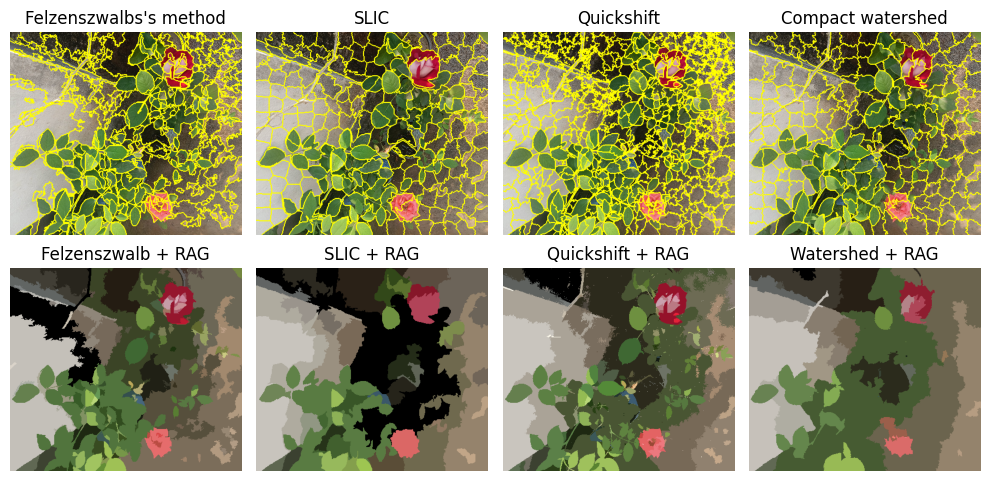

In [10]:
from skimage.color import rgb2gray, label2rgb
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed, mark_boundaries

img = plt.imread('images/rose.jpg')[::2, ::2] # downsamples

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1, start_label=1)
segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img))
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

print(f'Felzenszwalb number of segments: {len(np.unique(segments_fz))}')
print(f'SLIC number of segments: {len(np.unique(segments_slic))}')
print(f'Quickshift number of segments: {len(np.unique(segments_quick))}')
print(f'Watershed number of segments: {len(np.unique(segments_watershed))}')

fz_merged = merge_segments(img, segments_fz)
slic_merged = merge_segments(img, segments_slic)
quick_merged = merge_segments(img, segments_quick)
watershed_merged = merge_segments(img, segments_watershed)

# PLOT
fig, ax = plt.subplots(2, 4, figsize=(10, 5)) #, sharex=True, sharey=True)
ax = ax.ravel()
ax[0].imshow(mark_boundaries(img, segments_fz)), ax[0].set_title("Felzenszwalbs's method")
ax[1].imshow(mark_boundaries(img, segments_slic)), ax[1].set_title('SLIC')
ax[2].imshow(mark_boundaries(img, segments_quick)), ax[2].set_title('Quickshift')
ax[3].imshow(mark_boundaries(img, segments_watershed)), ax[3].set_title('Compact watershed')
ax[4].imshow(fz_merged), ax[4].set_title("Felzenszwalb + RAG")
ax[5].imshow(slic_merged), ax[5].set_title("SLIC + RAG")
ax[6].imshow(quick_merged), ax[6].set_title("Quickshift + RAG")
ax[7].imshow(watershed_merged), ax[7].set_title("Watershed + RAG")
for a in ax.ravel():
    a.set_axis_off()
plt.tight_layout()
plt.show()

### **4. Variational and Energy-Based Segmentation**

#### **4.1 Chan–Vese Active Contours**

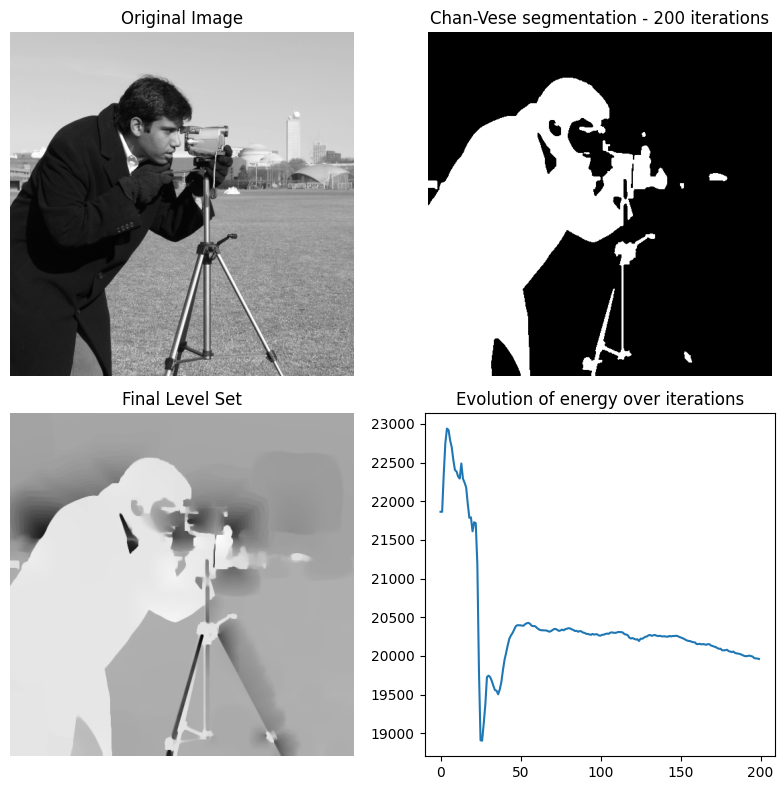

In [72]:
from skimage import data, img_as_float
from skimage.segmentation import chan_vese

image = img_as_float(data.camera())
# Feel free to play around with the parameters to see how they impact the result
cv = chan_vese(
    image,
    mu=0.25,
    lambda1=1,
    lambda2=1,
    tol=1e-3,
    max_num_iter=200,
    dt=0.5,
    init_level_set="checkerboard",
    extended_output=True,
)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.flatten()

ax[0].imshow(image, cmap="gray")
ax[0].set_axis_off()
ax[0].set_title("Original Image", fontsize=12)

ax[1].imshow(cv[0], cmap="gray")
ax[1].set_axis_off()
title = f'Chan-Vese segmentation - {len(cv[2])} iterations'
ax[1].set_title(title, fontsize=12)

ax[2].imshow(cv[1], cmap="gray")
ax[2].set_axis_off()
ax[2].set_title("Final Level Set", fontsize=12)

ax[3].plot(cv[2])
ax[3].set_title("Evolution of energy over iterations", fontsize=12)

fig.tight_layout()
plt.show()

#### **4.2 Mumford–Shah Functional**

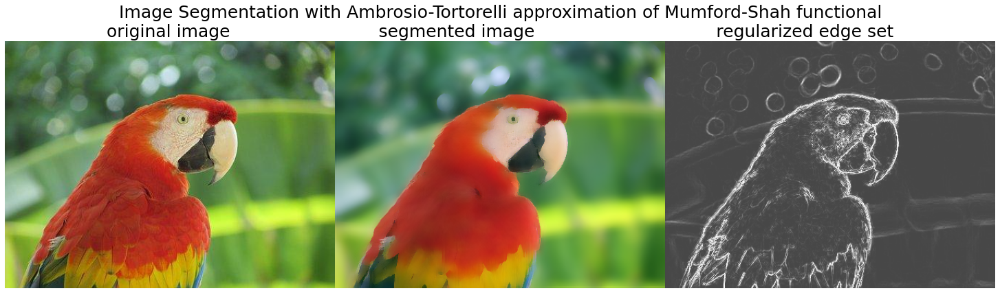

In [140]:
#Jacob Gildenblat, 2015
#Implementation of edge preserving smoothing by minimizing with the Ambrosio-Tortorelli appoach
#AM scheme, using conjugate gradients

class AmbrosioTortorelliMinimizer():
    def __init__(self, img, iterations = 1, solver_maxiterations = 10, tol = 0.1, alpha = 1000, beta = 0.01, epsilon = 0.01):
        self.iterations = iterations
        self.tol = tol
        self.g = np.float64(img) / np.max(img)
        self.f = self.g
        self.edges = np.zeros(img.shape)
        self.update_gradients()		
        self.alpha, self.beta, self.epsilon = alpha, beta, epsilon
        self.add_const = self.beta / (4 * self.epsilon)
        self.multiply_const = self.epsilon * self.beta
        self.maxiter = solver_maxiterations

    def update_gradients(self):
        self.grad_x, self.grad_y = self.gradients(self.f)
        self.gradient_mag = np.power(self.grad_x, 2) + np.power(self.grad_y, 2)

    def edge_linear_operator(self, input):
        v = input.reshape(*self.g.shape)
        # ∇2v −2α|∇u|2v/ρ −(v − 1)/ρ2
        result = np.multiply(v, self.gradient_mag * self.alpha + self.add_const) \
                - self.multiply_const* cv2.Laplacian(v, cv2.CV_64F)

        return result.reshape(*input.shape)

    def image_linear_operator(self, input):
        f = input.reshape(*self.g.shape)

        x, y = self.gradients(f)
        # ∇ · (v2∇u) − β/α (u − f)
        result = f - 2*self.alpha * (self.calc_grad_x(np.multiply(self.edges, x)) + \
                                     self.calc_grad_y(np.multiply(self.edges, y)) )
        return result.reshape(*input.shape)

    def solve_edges(self):
        size = self.g.shape[0]* self.g.shape[1]
        A = LinearOperator( (size, size), matvec = self.edge_linear_operator, dtype = np.float64)
        b = np.ones(size) * self.beta / (4 * self.epsilon)

        self.edges, _ = scipy.sparse.linalg.cg(A, b, tol = self.tol, maxiter = self.maxiter)
        self.edges = np.power(self.edges.reshape(*self.g.shape), 2)
        return self.edges

    def solve_image(self):
        size = self.g.shape[0]* self.g.shape[1]
        A = LinearOperator( (size, size), matvec = self.image_linear_operator, dtype = np.float64)
        b = self.g.reshape(size)

        self.f, _ = scipy.sparse.linalg.cg(A, b, tol = self.tol, maxiter = self.maxiter)
        self.f = self.f.reshape(*self.g.shape)
        self.update_gradients()
        return self.f

    def minimize(self):
        for i in range(0, self.iterations):
            self.solve_edges()
            self.solve_image()

        self.edges = np.power(self.edges, 0.5)
        cv2.normalize(self.f, self.f ,0,255,cv2.NORM_MINMAX)
        cv2.normalize(self.edges, self.edges ,0,255,cv2.NORM_MINMAX)
        self.f = np.uint8(self.f)
        self.edges = 255 - np.uint8(self.edges)

        return self.f, self.edges

    def calc_grad_x(self, img):
        return cv2.filter2D(img, cv2.CV_64F, np.array([[-1, 0, 1]]))

    def calc_grad_y(self, img):
        return cv2.filter2D(img, cv2.CV_64F, np.array([[-1, 0, 1]]).T)

    def gradients(self, img):
        return self.calc_grad_x(img), self.calc_grad_y(img)

f = plt.imread('images/parrot.jpg')
#f = f / f.max()

result, edges = [], []
for channel in cv2.split(f):
    solver = AmbrosioTortorelliMinimizer(channel, iterations = 1, tol = 0.1, solver_maxiterations = 6)
    u, v = solver.minimize()
    result.append(u)
    edges.append(v)

u = cv2.merge(result)
v = np.maximum(*edges)
v = gray2rgb(v)

plt.figure(figsize=(20,9))
plt.gray()
plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
plt.imshow(np.hstack((f, u, v))), plt.axis('off')
plt.title('Image Segmentation with Ambrosio-Tortorelli approximation of Mumford-Shah functional\n' +
         'original image \N{TaB} \N{TaB} \N{TaB} \N{TaB} segmented image \N{TaB} \N{TaB} \N{TaB} \N{TaB} regularized edge set'.expandtabs(), 
          size=25)
plt.show()

### **5. Graphical and Probabilistic Methods**

#### **5.1 GrabCut**

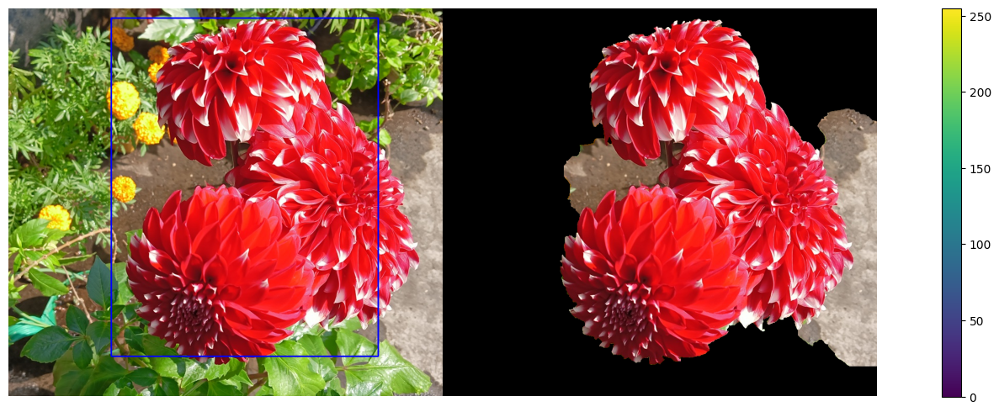

In [11]:
import cv2
img_orig = cv2.imread('images/dalhia.jpg')
img = img_orig.copy()
mask = np.zeros(img.shape[:2],np.uint8)
bg_model = np.zeros((1,65),np.float64)
fg_model = np.zeros((1,65),np.float64)
rect = (200,20,720,680) #(80,100,720,550)
cv2.grabCut(img, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
cv2.rectangle(img_orig, rect[:2], rect[-2:], (255,0,0), 2)
img = img*mask2[:,:,np.newaxis]
plt.figure(figsize=(20,6))
plt.imshow(np.hstack((cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB)))), plt.axis('off'), plt.colorbar()
plt.show()

In [13]:
newmask = cv2.imread('images/dalhia_mask.png')
# whereever it is marked green(sure foreground), change mask=1
# whereever it is marked red (sure background), change mask=0

The next figure shows how the input image with the scribbles (manual strokes):

<img src="images/dalhia_mask.png" width="500"/>

Now the algorithm needs to be run with this mask. The next code block shows how to run the `cv2.grabCut()` function with this mask. The following figure shows the output of the code block, the correctly segmented foreground object with the algorithm, with just the strokes in the mask as hints:

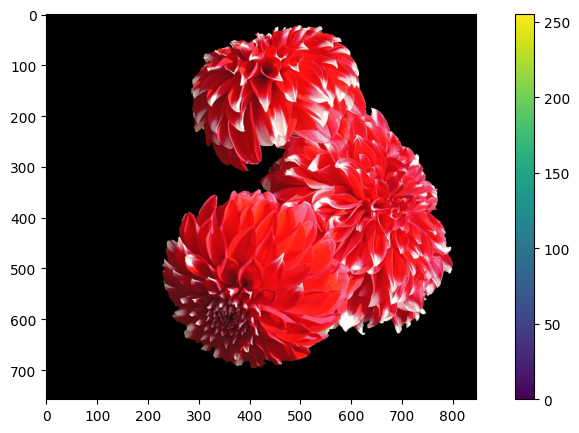

In [14]:
mask = 2*np.ones(img.shape[:2],np.uint8) # initialize all pixels to be probably backgrounds
mask[(newmask[...,0] >= 200)&(newmask[...,1] <= 20)&(newmask[...,2] <= 20)] = 0 # blue scribble pixels are surely backgrounds
mask[(newmask[...,0] <= 20)&(newmask[...,1] >= 200)&(newmask[...,2] <= 20)] = 1 # green scribble pixels are surely foregrounds
mask, bg_model, fg_model = cv2.grabCut(img,mask,None,bg_model,fg_model,5,cv2.GC_INIT_WITH_MASK)
mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask[:,:,np.newaxis]
plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)), plt.colorbar()
plt.show()

#### **5.2 Conditional Random Fields (CRF)**

Found a full-black pixel in annotation image, assuming it means 'unknown' label, and will thus not be present in the output!
If 0 is an actual label for you, consider writing your own code, or simply giving your labels only non-zero values.
3  labels  plus "unknown" 0:  {0, 1, 2, 3}
Using generic 2D functions
255 255


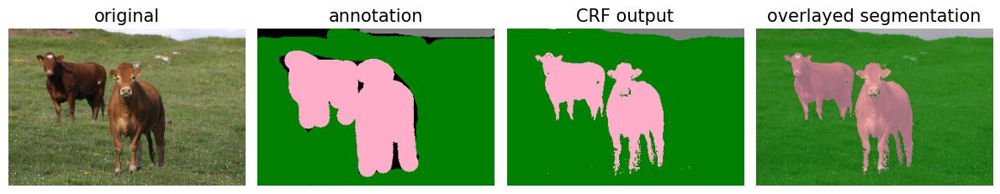

KL-divergence at 0: -420776.6650378704
KL-divergence at 1: -767993.014637647
KL-divergence at 2: -805176.3113676688
KL-divergence at 3: -807013.6780225509
KL-divergence at 4: -807369.9904136674


In [1]:
# conda create -n seg python=3.9 -y
# conda activate seg
# pip install git+https://github.com/lucasb-eyer/pydensecrf.git
import sys
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_labels, create_pairwise_bilateral, create_pairwise_gaussian
from skimage.io import imread

##################################
### Read images and annotation ###
##################################
img = imread('images/cow.png')

# Convert the annotation's RGB color to a single 32-bit integer color 0xBBGGRR
anno_rgb = imread('images/cow_annot.png').astype(np.uint32)
anno_lbl = anno_rgb[:,:,0] + (anno_rgb[:,:,1] << 8) + (anno_rgb[:,:,2] << 16)

# Convert the 32bit integer color to 1, 2, ... labels.
# Note that all-black, i.e. the value 0 for background will stay 0.
colors, labels = np.unique(anno_lbl, return_inverse=True)

# But remove the all-0 black, that won't exist in the MAP!
HAS_UNK = 0 in colors
if HAS_UNK:
    print("Found a full-black pixel in annotation image, assuming it means 'unknown' label, and will thus not be present in the output!")
    print("If 0 is an actual label for you, consider writing your own code, or simply giving your labels only non-zero values.")
    colors = colors[1:]
#else:
#    print("No single full-black pixel found in annotation image. Assuming there's no 'unknown' label!")

# And create a mapping back from the labels to 32bit integer colors.
colorize = np.empty((len(colors), 3), np.uint8)
colorize[:,0] = (colors & 0x0000FF)
colorize[:,1] = (colors & 0x00FF00) >> 8
colorize[:,2] = (colors & 0xFF0000) >> 16


# Compute the number of classes in the label image.
# We subtract one because the number shouldn't include the value 0 which stands
# for "unknown" or "unsure".
n_labels = len(set(labels.flat)) - int(HAS_UNK)
print(n_labels, " labels", (" plus \"unknown\" 0: " if HAS_UNK else ""), set(labels.flat))

### Setup the CRF model ###
# print("Using generic 2D functions")
# Example using the DenseCRF class and the util functions
d = dcrf.DenseCRF(img.shape[1] * img.shape[0], n_labels)

# get unary potentials (neg log probability)
U = unary_from_labels(labels, n_labels, gt_prob=0.7, zero_unsure=HAS_UNK)
d.setUnaryEnergy(U)

# This creates the color-independent features and then add them to the CRF
feats = create_pairwise_gaussian(sdims=(3, 3), shape=img.shape[:2])
d.addPairwiseEnergy(feats, compat=3,
                    kernel=dcrf.DIAG_KERNEL,
                    normalization=dcrf.NORMALIZE_SYMMETRIC)

# This creates the color-dependent features and then add them to the CRF
feats = create_pairwise_bilateral(sdims=(80, 80), schan=(13, 13, 13),
                                  img=img, chdim=2)
d.addPairwiseEnergy(feats, compat=10,
                    kernel=dcrf.DIAG_KERNEL,
                    normalization=dcrf.NORMALIZE_SYMMETRIC)
    
####################################
### Do inference and compute MAP ###
####################################

# Run five inference steps.
Q = d.inference(5)

# Find out the most probable class for each pixel.
MAP = np.argmax(Q, axis=0)

# Convert the MAP (labels) back to the corresponding colors and save the image.
# Note that there is no "unknown" here anymore, no matter what we had at first.
MAP = colorize[MAP,:]
MAP = MAP.reshape(img.shape)
print(MAP.max(), img.max())

plt.figure(figsize=(12,8))
plt.subplot(141), plt.imshow(img), plt.axis('off'), plt.title('original', size=15)
plt.subplot(142), plt.imshow(anno_rgb), plt.axis('off'), plt.title('annotation', size=15)
plt.subplot(143), plt.imshow(MAP), plt.axis('off'), plt.title('CRF output', size=15)
plt.subplot(144), plt.imshow((0.6*MAP + 0.4*img).astype(np.uint8)), plt.axis('off'), plt.title('overlayed segmentation', size=15)
plt.tight_layout()
plt.show()

# Just randomly manually run inference iterations
Q, tmp1, tmp2 = d.startInference()
for i in range(5):
    print("KL-divergence at {}: {}".format(i, d.klDivergence(Q)))
    d.stepInference(Q, tmp1, tmp2)

### **6. Learning-Based Classical Segmentation**

#### **6.1 Segmentation using Classification**

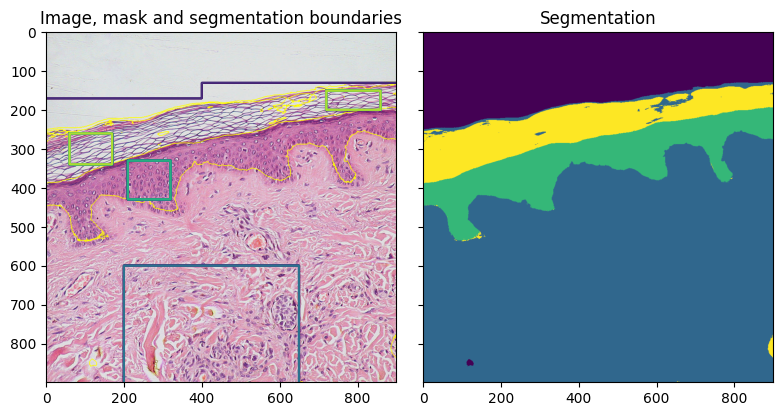

In [2]:
# python -m pip install -U scikit-image[data]
from skimage import data, segmentation, feature, future
from sklearn.ensemble import RandomForestClassifier
from functools import partial

full_img = data.skin()
img = full_img[:900, :900]

# Build an array of labels for training the segmentation.
# Here we use rectangles but visualization libraries such as plotly
# (and napari?) can be used to draw a mask on the image.
training_labels = np.zeros(img.shape[:2], dtype=np.uint8)
training_labels[:130] = 1
training_labels[:170, :400] = 1
training_labels[600:900, 200:650] = 2
training_labels[330:430, 210:320] = 3
training_labels[260:340, 60:170] = 4
training_labels[150:200, 720:860] = 4

sigma_min = 1
sigma_max = 16
features_func = partial(
    feature.multiscale_basic_features,
    intensity=True,
    edges=False,
    texture=True,
    sigma_min=sigma_min,
    sigma_max=sigma_max,
    channel_axis=-1,
)
features = features_func(img)
clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, max_depth=10, max_samples=0.05)
clf = future.fit_segmenter(training_labels, features, clf)
result = future.predict_segmenter(features, clf)

fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))
ax[0].imshow(segmentation.mark_boundaries(img, result, mode='thick'))
ax[0].contour(training_labels)
ax[0].set_title('Image, mask and segmentation boundaries')
ax[1].imshow(result)
ax[1].set_title('Segmentation')
fig.tight_layout()

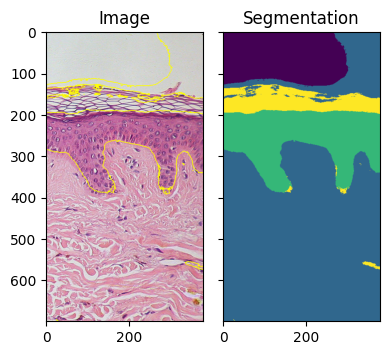

In [4]:
img_new = full_img[:700, 900:]
features_new = features_func(img_new)
result_new = future.predict_segmenter(features_new, clf)

fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(4, 4))
ax[0].imshow(segmentation.mark_boundaries(img_new, result_new, mode='thick'))
ax[0].set_title('Image')
ax[1].imshow(result_new)
ax[1].set_title('Segmentation')
fig.tight_layout()
plt.show()

#### **6.2 Ensemble Segmentation**

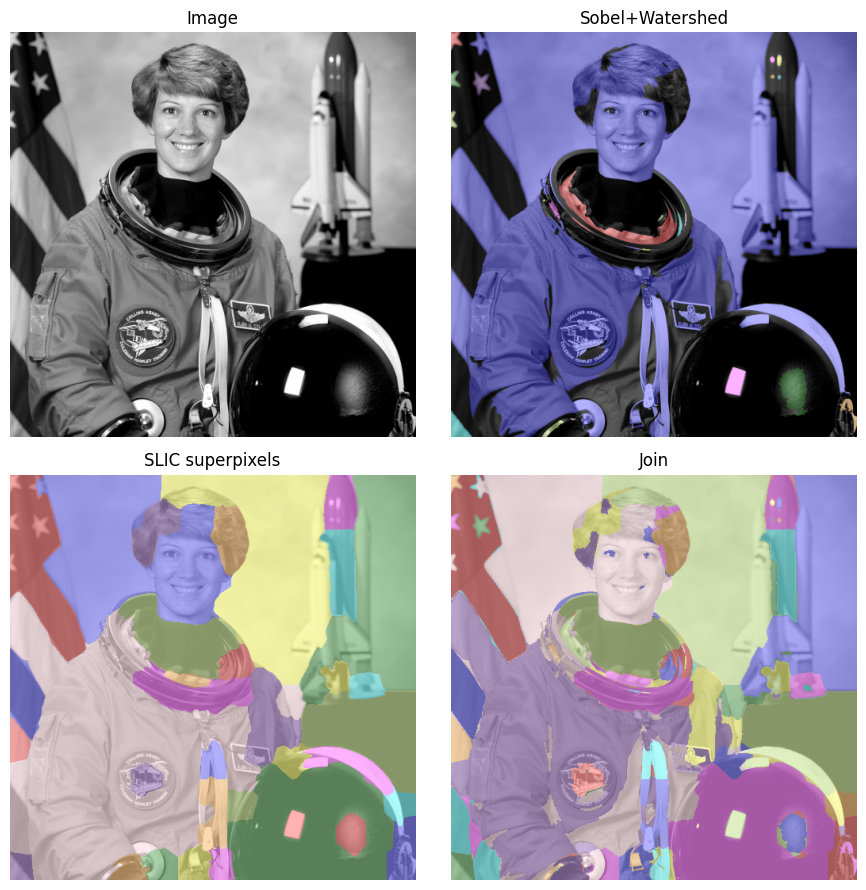

In [65]:
from skimage.filters import sobel
from skimage.measure import label
from skimage.segmentation import slic, join_segmentations, watershed
from skimage import graph, data
from skimage.color import label2rgb, rgb2gray

coins =  (255*rgb2gray(data.astronaut())).astype('uint8') ##data.camera()

# Make segmentation using edge-detection and watershed.
edges = sobel(coins)

# Identify some background and foreground pixels from the intensity values.
# These pixels are used as seeds for watershed.
markers = np.zeros_like(coins)
foreground, background = 1, 2
markers[coins < 30.0] = background
markers[coins > 150.0] = foreground

ws = watershed(edges, markers)
seg1 = label(ws == foreground)

# Make segmentation using SLIC superpixels.
seg2 = slic(
    coins,
    n_segments=200,
    max_num_iter=160,
    sigma=1,
    compactness=0.75,
    channel_axis=None,
    start_label=0,
)
g = graph.rag_mean_color(coins, seg2, mode='similarity')
seg2 = graph.cut_normalized(seg2, g)

# Combine the two.
segj = join_segmentations(seg1, seg2)

# Show the segmentations.
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(9, 9), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(coins, cmap='gray')
ax[0].set_title('Image')

color1 = label2rgb(seg1, image=coins, bg_label=0)
ax[1].imshow(color1)
ax[1].set_title('Sobel+Watershed')

color2 = label2rgb(seg2, image=coins, image_alpha=0.5, bg_label=-1)
ax[2].imshow(color2)
ax[2].set_title('SLIC superpixels')

color3 = label2rgb(segj, image=coins, image_alpha=0.5, bg_label=-1)
ax[3].imshow(color3)
ax[3].set_title('Join')

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

---

## **Part II — Deep Learning for Image Segmentation**

---

### **1. Semantic Segmentation with CNNs**


#### **1.1 Fully Convolutional Networks (FCN)**

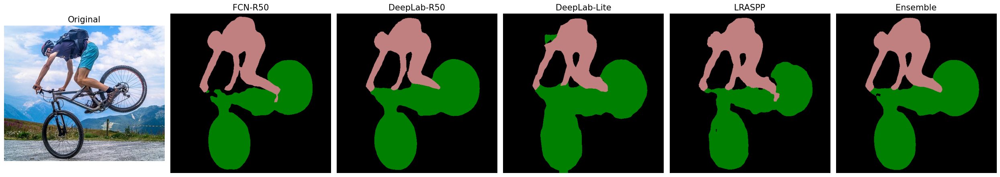

In [27]:
import torch
import torch.nn.functional as F
from torchvision.models.segmentation import (
    fcn_resnet50, FCN_ResNet50_Weights,
    deeplabv3_resnet50, DeepLabV3_ResNet50_Weights,
    deeplabv3_mobilenet_v3_large, DeepLabV3_MobileNet_V3_Large_Weights,
    lraspp_mobilenet_v3_large, LRASPP_MobileNet_V3_Large_Weights
)
import cv2
import numpy as np
import matplotlib.pyplot as plt

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# 1️⃣ Load FULLY Pre-trained Torchvision Models
# These models have both encoder AND decoder pre-trained on COCO/VOC.
models_dict = {
    "FCN-R50": fcn_resnet50(weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1),
    "DeepLab-R50": deeplabv3_resnet50(weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1),
    "DeepLab-Lite": deeplabv3_mobilenet_v3_large(weights=DeepLabV3_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1),
    "LRASPP": lraspp_mobilenet_v3_large(weights=LRASPP_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1)
}

for name in models_dict:
    models_dict[name] = models_dict[name].to(DEVICE).eval()

# 2️⃣ Robust Preprocessing (Fixed DoubleTensor error)
def preprocess(img_rgb):
    # Resize to a standard size for segmentation
    img_res = cv2.resize(img_rgb, (512, 512))
    img_float = img_res.astype(np.float32) / 255.0
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img_norm = (img_float - mean) / std
    # .float() ensures FloatTensor (32-bit) instead of DoubleTensor (64-bit)
    return torch.from_numpy(img_norm).permute(2, 0, 1).unsqueeze(0).to(DEVICE).float()

img = cv2.imread("images/cycle.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
input_tensor = preprocess(img_rgb)

# 3️⃣ Inference & Ensemble
prob_maps = []
individual_masks = []

with torch.no_grad():
    for name, model in models_dict.items():
        output = model(input_tensor)["out"]
        
        # Ensure spatial alignment (some models output different scales)
        if output.shape[-2:] != (512, 512):
            output = F.interpolate(output, size=(512, 512), mode='bilinear', align_corners=False)
            
        probs = F.softmax(output, dim=1)
        prob_maps.append(probs)
        individual_masks.append(torch.argmax(probs, dim=1).squeeze().cpu().numpy())

# Soft Voting Ensemble
ensemble_prob = torch.mean(torch.stack(prob_maps), dim=0)
ensemble_mask = torch.argmax(ensemble_prob, dim=1).squeeze().cpu().numpy()

# 4️⃣ Professional Visualization
def colorize_voc(mask):
    palette = np.array([[0,0,0],[128,0,0],[0,128,0],[128,128,0],[0,0,128],[128,0,128],
                        [0,128,128],[128,128,128],[64,0,0],[192,0,0],[64,128,0],
                        [192,128,0],[64,0,128],[192,0,128],[64,128,128],[192,128,128],
                        [0,64,0],[128,64,0],[0,192,0],[128,192,0],[0,64,128]])
    return palette[mask.astype(np.uint8)]

titles = ["Original"] + list(models_dict.keys()) + ["Ensemble"]
imgs = [img_rgb] + [colorize_voc(m) for m in individual_masks] + [colorize_voc(ensemble_mask)]

plt.figure(figsize=(25, 8))
for i, (title, im) in enumerate(zip(titles, imgs)):
    plt.subplot(1, len(titles), i + 1), plt.imshow(im), plt.title(title, fontsize=15), plt.axis("off")

plt.tight_layout()
plt.show()

#### **1.2 Atrous Convolution and the DeepLab Family**

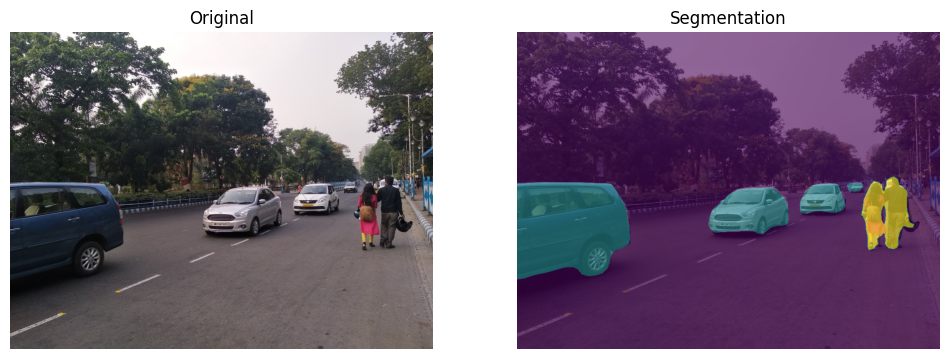

In [25]:
import torch
import torch.nn.functional as F
from torchvision.models.segmentation import deeplabv3_resnet101, DeepLabV3_ResNet101_Weights
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Use stronger backbone
weights = DeepLabV3_ResNet101_Weights.DEFAULT # trained on COCO
model = deeplabv3_resnet101(weights=weights).to(device)
model.eval()

# Correct preprocessing
transform = weights.transforms()

img = Image.open("images/traffic.png").convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

with torch.no_grad():
    output = model(input_tensor)["out"]

# Resize to original image size
output = F.interpolate(
    output,
    size=img.size[::-1],  # (H, W)
    mode="bilinear",
    align_corners=False
)

seg_img = torch.argmax(output, dim=1)[0].cpu().numpy()

plt.figure(figsize=(12,6))
plt.subplot(1,2,1), plt.imshow(img), plt.title("Original"), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(img), plt.imshow(seg_img, alpha=0.6), plt.title("Segmentation"), plt.axis("off")
plt.show()

#### **with `tensorflow` model garden**


In [ ]:
import tensorflow as tf, numpy as np, cv2, tarfile, os, urllib.request
from PIL import Image
import matplotlib.gridspec as gridspec

MODEL_URL = "http://download.tensorflow.org/models/deeplabv3_mnv2_cityscapes_train_2018_02_05.tar.gz"
MODEL_FILE = "models/deeplab_model.tar.gz"

# -------- Download model if needed --------
if not os.path.exists(MODEL_FILE):
    urllib.request.urlretrieve(MODEL_URL, MODEL_FILE)

# -------- Load frozen graph --------
tar = tarfile.open(MODEL_FILE)
for m in tar.getmembers():
    if "frozen_inference_graph" in m.name:
        graph_def = tf.compat.v1.GraphDef.FromString(tar.extractfile(m).read())
tar.close()

model = tf.function(lambda x:
    tf.import_graph_def(graph_def,
                        input_map={"ImageTensor:0": x},
                        return_elements=["SemanticPredictions:0"])
)

# -------- cityscapes classes --------
LABELS=np.array([
'road','sidewalk','building','wall','fence','pole','traffic light',
'traffic sign','vegetation','terrain','sky','person','rider','car',
'truck','bus','train','motorcycle','bicycle','void'])

COLORS=np.array([
[128,64,128],[244,35,232],[70,70,70],[102,102,156],[190,153,153],
[153,153,153],[250,170,30],[220,220,0],[107,142,35],[152,251,152],
[70,130,180],[220,20,60],[255,0,0],[0,0,142],[0,0,70],
[0,60,100],[0,80,100],[0,0,230],[119,11,32],[0,0,0]],dtype=np.uint8)

# -------- Read image --------
# https://github.com/lexfridman/mit-deep-learning/blob/master/tutorial_driving_scene_segmentation/mit_driveseg_sample.png
def segment(img_file, gt_file=None):
    img = Image.open(img_file).convert("RGB")
    h, w = img.size[1], img.size[0]
    inp = np.asarray(img.resize((2049,1025)))[None]
    # -------- inference --------
    seg=model(inp)[0].numpy()[0]
    seg=cv2.resize(seg,(w,h),interpolation=cv2.INTER_NEAREST)
    if gt_file:
        gt = cv2.imread(gt_file)
        gt = gt[:, :, 0]  # select a single channel from the 3-channel image
        gt[gt==255] = 19  # void class, does not count for accuracy
    else:
        gt = None
    return img, seg, gt
    
def visualize(img, seg, title='prediction', with_legend=False):
    seg_color=COLORS[seg]
    # -------- legend labels present --------
    labels=np.unique(seg)
    # -------- visualization --------
    plt.figure(figsize=(15,4))
    gs=gridspec.GridSpec(1,3+int(with_legend),width_ratios=[6,6,6,2] if with_legend else [6,6,6])
    plt.subplot(gs[0]); plt.imshow(img); plt.axis("off"); plt.title("Image")
    plt.subplot(gs[1]); plt.imshow(seg_color); plt.axis("off"); plt.title("Segmentation")
    plt.subplot(gs[2]); plt.imshow(img); plt.imshow(seg_color,alpha=0.6)
    plt.axis("off"); plt.title("Overlay")
    if with_legend:
        ax=plt.subplot(gs[3])
        ax.imshow(COLORS[labels].reshape(len(labels),1,3))
        ax.set_yticks(range(len(labels))), ax.set_yticklabels(LABELS[labels]), ax.set_xticks([])
        ax.yaxis.tick_right()
    plt.suptitle(title, size=15)
    plt.tight_layout()
    plt.show()

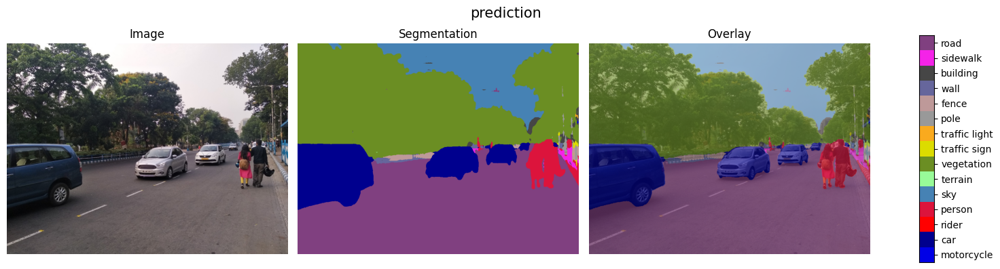

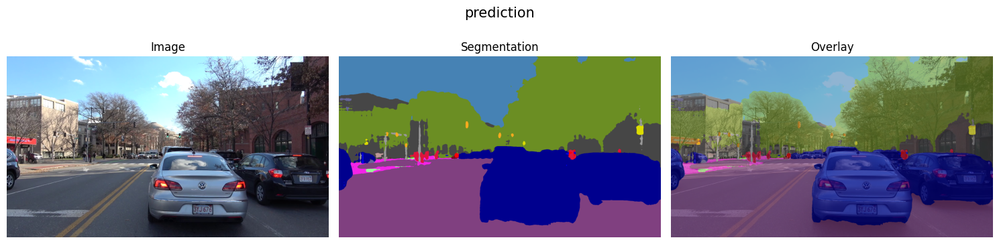

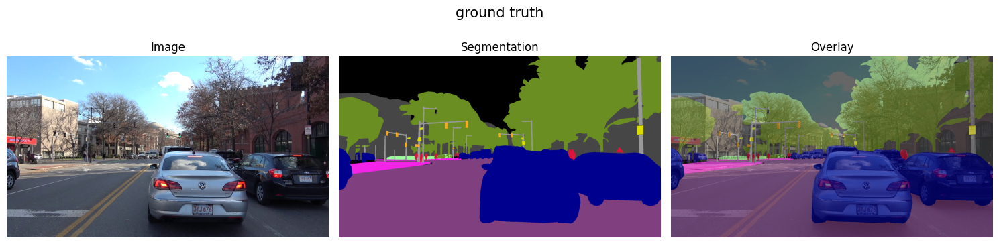

In [29]:
img, seg, _ = segment("images/traffic.png")
visualize(img, seg, with_legend=True)
img, seg, gt = segment("images/mit_driveseg_sample.png", "images/mit_driveseg_sample_gt.png")
visualize(img, seg)
visualize(img, gt, title='ground truth')

In [23]:
## model evaluation
from sklearn.metrics import confusion_matrix
from tabulate import tabulate

def evaluate_single(seg_map, ground_truth):
    """Evaluate a single frame with the MODEL loaded."""    
    # merge label due to different annotation scheme
    seg_map[np.logical_or(seg_map==14,seg_map==15)] = 13
    seg_map[np.logical_or(seg_map==3,seg_map==4)] = 2
    seg_map[seg_map==12] = 11

    # calculate accuracy on valid area
    acc = np.sum(seg_map[ground_truth!=19]==ground_truth[ground_truth!=19])/np.sum(ground_truth!=19)
    
    # select valid labels for evaluation
    cm = confusion_matrix(ground_truth[ground_truth!=19], seg_map[ground_truth!=19], 
                          labels=np.array([0,1,2,5,6,7,8,9,11,13]))
    intersection = np.diag(cm)
    union = np.sum(cm, 0) + np.sum(cm, 1) - np.diag(cm)
    return acc, intersection, union

print('evaluating on the sample image...')
acc, intersection, union = evaluate_single(seg, gt)
class_iou = np.round(intersection / union, 5)
print('pixel accuracy: %.5f'%acc)
print('mean class IoU:', np.mean(class_iou))
print('class IoU:')
print(tabulate([class_iou], headers=LABELS[[0,1,2,5,6,7,8,9,11,13]]))

evaluating on the sample image...
pixel accuracy: 0.90714
mean class IoU: 0.535555
class IoU:
   road    sidewalk    building    pole    traffic light    traffic sign    vegetation    terrain    person      car
-------  ----------  ----------  ------  ---------------  --------------  ------------  ---------  --------  -------
0.96108     0.35258     0.53097  0.1638          0.46852         0.52835       0.81995    0.05112   0.50904  0.97014


#### **with `torch.hub`**

Using cache found in C:\Users\sandi/.cache\torch\hub\pytorch_vision_v0.15.2


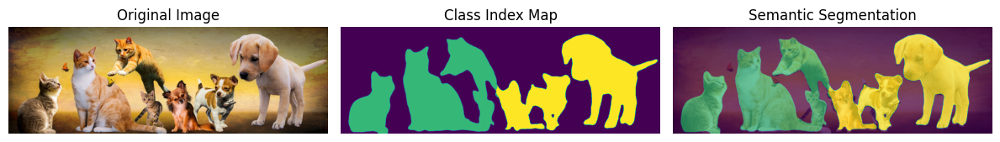

In [11]:
import torch
import torchvision
import torchvision.transforms as T

# Load pretrained DeepLabV3 model
model = torch.hub.load(
    'pytorch/vision:v0.15.2',
    'deeplabv3_resnet50',
    pretrained=True
)

model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Image preprocessing
transform = T.Compose([
    #T.Resize(520),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Load image
img = Image.open("images/cats_dogs.jpg").convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

# Inference
with torch.no_grad():
    output = model(input_tensor)['out'][0]

# Get predicted class per pixel
pred = output.argmax(0).cpu().numpy()

def decode_segmap(mask, num_classes=21):
    # Pascal VOC color map
    label_colors = np.array([
        (0, 0, 0),       # background
        (128, 0, 0),     # aeroplane
        (0, 128, 0),
        (128, 128, 0),
        (0, 0, 128),
        (128, 0, 128),
        (0, 128, 128),
        (128, 128, 128),
        (64, 0, 0),
        (192, 0, 0),
        (64, 128, 0),
        (192, 128, 0),
        (64, 0, 128),
        (192, 0, 128),
        (64, 128, 128),
        (192, 128, 128),
        (0, 64, 0),
        (128, 64, 0),
        (0, 192, 0),
        (128, 192, 0),
        (0, 64, 128)
    ])

    rgb = label_colors[mask]
    return rgb

segmented_image = pred #decode_segmap(pred)

plt.figure(figsize=(12,5))
plt.subplot(1,3,1), plt.imshow(img), plt.title("Original Image"), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(segmented_image), plt.title("Class Index Map"), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(img), plt.imshow(segmented_image, alpha=0.7), plt.title("Semantic Segmentation"), plt.axis('off')
plt.tight_layout()
plt.show()

#### **with `Keras_hub`**

In [ ]:
# !pip install --upgrade keras-hub
import keras, keras_hub
model = keras_hub.models.DeepLabV3ImageSegmenter.from_preset("deeplab_v3_plus_resnet50_pascalvoc")
image_converter = keras_hub.layers.DeepLabV3ImageConverter(image_size=(512, 512), interpolation="bilinear")
preprocessor = keras_hub.models.DeepLabV3ImageSegmenterPreprocessor(image_converter)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


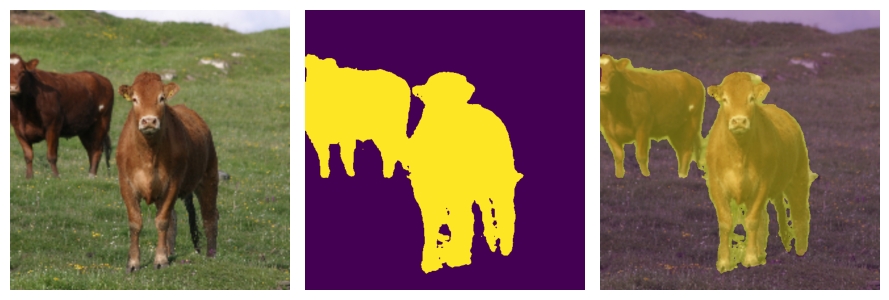

In [14]:
image = keras.utils.load_img('cow.png')
image = np.array(image)
image = preprocessor(image)
image = keras.ops.expand_dims(image, axis=0)
preds = ops.expand_dims(ops.argmax(model.predict(image), axis=-1), axis=-1)

def plot_segmentation(original_image, predicted_mask):
    plt.figure(figsize=(9, 5))
    plt.subplot(1, 3, 1), plt.imshow(original_image[0] / 255), plt.axis("off")
    plt.subplot(1, 3, 2), plt.imshow(predicted_mask[0]), plt.axis("off")
    plt.subplot(1, 3, 3), plt.imshow(original_image[0] / 255), plt.imshow(predicted_mask[0], alpha=0.4), plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_segmentation(image, preds)

#### **with `keras-cv`**

In [ ]:
#!pip install keras_cv
import keras_cv
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Pascal VOC colormap
def voc_colormap(N=256):
    cmap = np.zeros((N,3), dtype=np.uint8)

    for i in range(N):
        r=g=b=0
        cid=i
        for j in range(8):
            r |= ((cid>>0)&1)<<(7-j)
            g |= ((cid>>1)&1)<<(7-j)
            b |= ((cid>>2)&1)<<(7-j)
            cid >>=3
        cmap[i]=[r,g,b]

    return cmap

VOC_COLORS = voc_colormap()

# Load pretrained model
model = keras_cv.models.DeepLabV3Plus.from_preset("deeplab_v3_plus_resnet50_pascalvoc")

def plot_seg(img, seg):
  # Convert to VOC colors
  seg_color = VOC_COLORS[seg]
  # Visualization
  plt.figure(figsize=(11,4))
  plt.subplot(1,3,1), plt.title("Input Image"), plt.imshow(img), plt.axis("off")
  plt.subplot(1,3,2), plt.title("Segmentation (VOC colors)"), plt.imshow(seg_color), plt.axis("off")
  plt.subplot(1,3,3), plt.title("Overlay"), plt.imshow(img), plt.imshow(seg_color, alpha=0.5), plt.axis("off")
  plt.tight_layout()
  plt.show()

for IMAGE_PATH in ["bike.jpg", "man_horse.png", "plane.jpg", "cycle.jpg"]:
  # Load image
  img = Image.open(IMAGE_PATH).convert("RGB")
  img = img.resize((512,512))
  x = np.array(img).astype("float32")   # DO NOT divide by 255
  x = np.expand_dims(x,0)
  # Predict segmentation
  pred = model.predict(x)
  seg = np.argmax(pred[0], axis=-1)
  plot_seg(img, seg)

![](images/kerascv_deeplab_pascal_1.png)
![](images/kerascv_deeplab_pascal_2.png)

#### **1.3 with segmentation_models_pytorch (SMP) and Torchvision**

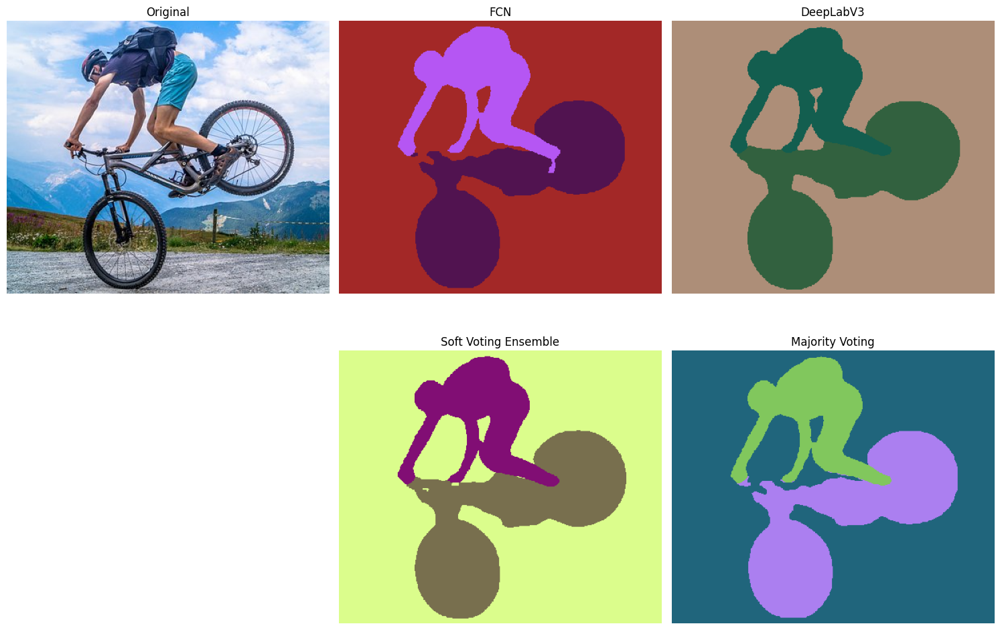

In [1]:
import torch
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from torchvision.models.segmentation import fcn_resnet50, deeplabv3_resnet101
import cv2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# 1️⃣ Load Models
models = []

# FCN (torchvision)
model_fcn = fcn_resnet50(weights="DEFAULT").to(DEVICE).eval()
models.append(("FCN", model_fcn))

# DeepLabV3
model_dl = deeplabv3_resnet101(weights="DEFAULT").to(DEVICE).eval()
models.append(("DeepLabV3", model_dl))

# 2️⃣ Preprocessing
preprocess = smp.encoders.get_preprocessing_fn("resnet34", "imagenet")

img = cv2.imread("images/cycle.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
orig_h, orig_w = img_rgb.shape[:2]

img_resized = cv2.resize(img_rgb, (512, 512))
img_norm = preprocess(img_resized)

img_tensor = torch.from_numpy(img_norm).permute(2,0,1).unsqueeze(0).float().to(DEVICE)

# 3️⃣ Run All Models
prob_maps = []
hard_masks = []

with torch.no_grad():
    for name, model in models:
        
        if name in ["FCN", "DeepLabV3"]:
            output = model(img_tensor)["out"]
        else:
            output = model(img_tensor)
        
        prob = F.softmax(output, dim=1)
        prob_maps.append(prob)
        
        mask = torch.argmax(prob, dim=1)
        hard_masks.append(mask)

# 4️⃣ Soft Voting Ensemble
ensemble_prob = torch.mean(torch.stack(prob_maps), dim=0)
ensemble_mask = torch.argmax(ensemble_prob, dim=1).squeeze().cpu().numpy()

# Resize back
ensemble_mask = cv2.resize(
    ensemble_mask.astype(np.uint8),
    (orig_w, orig_h),
    interpolation=cv2.INTER_NEAREST
)

# 5️⃣ Majority Voting
hard_stack = torch.stack(hard_masks)
majority_mask = torch.mode(hard_stack, dim=0)[0].squeeze().cpu().numpy()
majority_mask = cv2.resize(
    majority_mask.astype(np.uint8),
    (orig_w, orig_h),
    interpolation=cv2.INTER_NEAREST
)

# 6️⃣ Resize Individual Masks
individual_masks = []
for mask in hard_masks:
    m = mask.squeeze().cpu().numpy()
    m = cv2.resize(m.astype(np.uint8),
                   (orig_w, orig_h),
                   interpolation=cv2.INTER_NEAREST)
    individual_masks.append(m)

# 7️⃣ Visualization
def colorize(mask):
    colors = np.random.randint(0,255,(21,3))
    return colors[mask]

plt.figure(figsize=(20,10))
plt.subplot(2,4,1), plt.imshow(img_rgb), plt.title("Original"), plt.axis("off")
for i,(name,_) in enumerate(models):
    plt.subplot(2,4,i+2), plt.imshow(colorize(individual_masks[i])), plt.title(name), plt.axis("off")
plt.subplot(2,4,6), plt.imshow(colorize(ensemble_mask)), plt.title("Soft Voting Ensemble"), plt.axis("off")
plt.subplot(2,4,7), plt.imshow(colorize(majority_mask)), plt.title("Majority Voting"), plt.axis("off")
plt.tight_layout()
plt.show()

### **2. Instance Segmentation**

#### **2.1 Mask R-CNN: A Two-Stage Instance Segmentation Framework**

427 1280


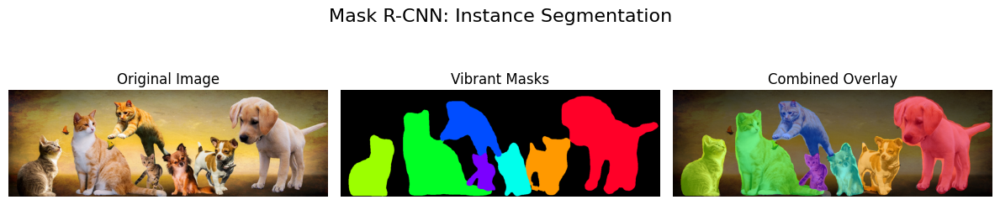

In [70]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"

# 1. Load pretrained model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
model.to(device)
model.eval()

# 2. Load and Transform image
image = Image.open('images/cats_dogs.jpg').convert("RGB")
transform = transforms.ToTensor()
img_tensor = transform(image).unsqueeze(0).to(device)

# 3. Inference (forward pass)
with torch.no_grad():
    outputs = model(img_tensor)

# 4. Filter Results
scores = outputs[0]['scores']
masks = outputs[0]['masks']
labels = outputs[0]['labels']
keep = scores > 0.7
masks = masks[keep].cpu().numpy()

# 5. Create Vibrant Overlay
# Get dimensions (H, W)
h, w = masks.shape[-2:]
print(h, w)
combined_mask = np.zeros((h, w, 3)) # RGB canvas

# Use a high-contrast colormap for vibrancy
cmap = plt.get_cmap('gist_rainbow') 

for i, m in enumerate(masks):
    mask_binary = m.squeeze() > 0.3  # Threshold the soft mask
    color = np.array(cmap(i / len(masks))[:3]) # Get vibrant RGB
    combined_mask[mask_binary] = color

# 6. Plotting
plt.figure(figsize=(12, 3))

# Subplot 1: Original
plt.subplot(131)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

# Subplot 2: Vibrant Masks Only
plt.subplot(132)
plt.imshow(combined_mask)
plt.title("Vibrant Masks")
plt.axis('off')

# Subplot 3: Overlay on Image
plt.subplot(133)
plt.imshow(image)
# We overlay the combined mask with alpha
plt.imshow(combined_mask, alpha=0.5) 
plt.title("Combined Overlay")
plt.axis('off')

plt.suptitle("Mask R-CNN: Instance Segmentation", fontsize=16)
plt.tight_layout()
plt.show()

#### **2.2 YOLO (YOLOv8 / YOLOv11): a single-stage formulation**


image 1/1 D:\My Books\Packt\Hands-on-Image_Processing 2nd Edition\Hands-On-Image-Processing-with-Python-Second-Edition\Chapter10\images\men_dogs.jpg: 640x576 3 persons, 3 dogs, 1 backpack, 1 handbag, 24.8ms
Speed: 4.3ms preprocess, 24.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 576)


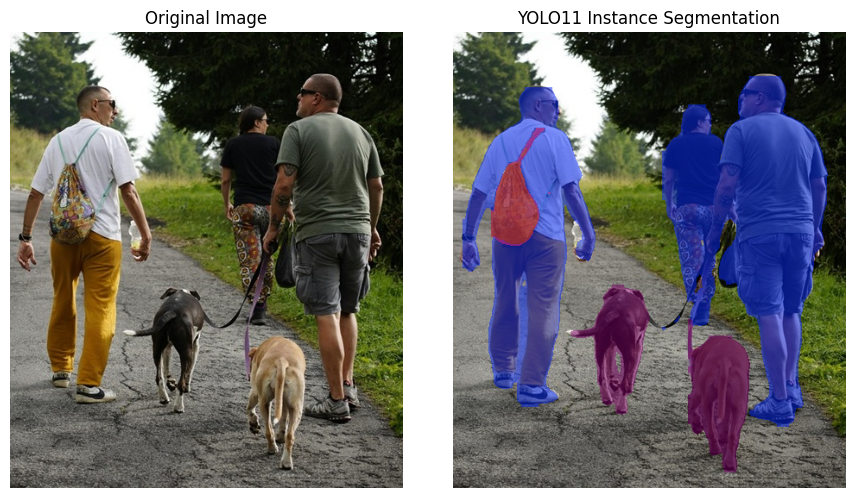

In [29]:
import cv2
import matplotlib.patches as mpatches
from ultralytics import YOLO
from ultralytics.utils.plotting import colors # To get exact YOLO colors

# 1. Load the YOLO11 instance segmentation model
model = YOLO("yolo11n-seg.pt")

# 2. Run inference
img_path = "images/men_dogs.jpg"
results = model.predict(img_path, conf=0.25)
result = results[0]

# 3. Prepare the images for plotting
# Load original image with OpenCV and convert BGR to RGB
original_img = cv2.imread(img_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Get the annotated image from the results (this includes masks, boxes, and labels)
# .plot() returns a BGR numpy array
annotated_img = result.plot(boxes=False, labels=True, conf=False)
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
 
# 4. Create side-by-side plot
fig, axes = plt.subplots(1, 2, figsize=(9, 5))
axes[0].imshow(original_img), axes[0].set_title("Original Image"), axes[0].axis("off")
axes[1].imshow(annotated_img), axes[1].set_title("YOLO11 Instance Segmentation"), axes[1].axis("off")
plt.tight_layout()
plt.show()

### **3. Transformer-Based Segmentation**

#### **3.1 with DPT** 

In [ ]:
import torch
from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# 1. Load the Model with the CORRECT identifier
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Official DPT ViT-Large identifier
model_id = "Intel/dpt-large-ade" 

processor = DPTImageProcessor.from_pretrained(model_id)
model = DPTForSemanticSegmentation.from_pretrained(model_id).to(device)

# 2. Process Image
image = Image.open("images/men_beach2.jpg").convert("RGB")
inputs = processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# 3. Post-Process
# DPT logits need to be interpolated back to original image size
logits = outputs.logits
prediction = torch.nn.functional.interpolate(
    logits, size=image.size[::-1], mode="bilinear", align_corners=False
)
seg_map = prediction.argmax(1).squeeze().cpu().numpy()

# 4. Vibrant Colorization
def get_vibrant_mask(mask):
    h, w = mask.shape
    color_img = np.zeros((h, w, 3), dtype=np.uint8)
    unique_ids = np.unique(mask)
    
    for uid in unique_ids:
        # Use UID as seed for consistent but discriminating colors
        np.random.seed(int(uid))
        color = np.random.randint(0, 255, (3,), dtype=np.uint8)
        color_img[mask == uid] = color
    return color_img

seg_color = get_vibrant_mask(seg_map)
image_np = np.array(image)
overlay = (image_np * 0.5 + seg_color * 0.5).astype(np.uint8)

# 5. Side-by-Side Visualization
fig, axes = plt.subplots(1, 3, figsize=(20, 7))
axes[0].imshow(image_np), axes[0].set_title("Original"), axes[0].axis("off")
axes[1].imshow(seg_color), axes[1].set_title("ViT-DPT Segmentation"), axes[1].axis("off")
axes[2].imshow(overlay), axes[2].set_title("Overlay"), axes[2].axis("off")
plt.tight_layout()
plt.savefig('images/out_vit_sem.png')
plt.close()

![](images/out_vit_sem.png)

#### **3.2 with DETR**

Loading weights:   0%|          | 0/562 [00:00<?, ?it/s]

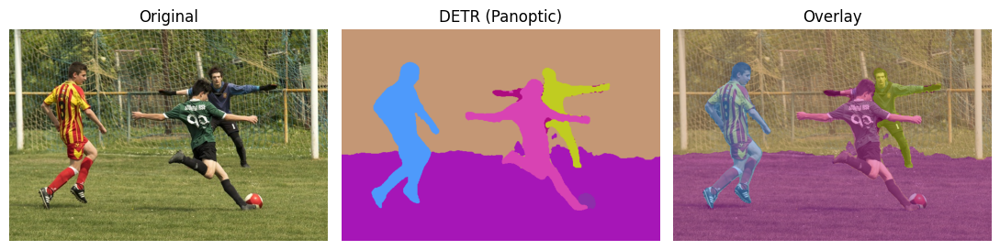

In [5]:
import torch
from transformers import (
    DetrImageProcessor,
    DetrForSegmentation,
 )

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2️⃣ DETR (Panoptic Segmentation)
detr_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50-panoptic")
detr_model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic").to(device)

# COLOR UTILS
def colorize(mask):
    if isinstance(mask, torch.Tensor):
        mask = mask.cpu().numpy()
    mask = mask.astype(np.int32)
    np.random.seed(0)
    cmap = np.random.randint(0, 255, (256, 3), dtype=np.uint8)
    return cmap[mask]

def overlay(image, mask, alpha=0.5):
    return (image * (1 - alpha) + mask * alpha).astype(np.uint8)

# MAIN PIPELINE
def run_pipeline(image_path):

    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)

    # 2️⃣ DETR (Panoptic)
    inputs = detr_processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = detr_model(**inputs)
    detr_result = detr_processor.post_process_panoptic_segmentation(
        outputs,
        target_sizes=[image.size[::-1]]
    )[0]
    detr_map = detr_result["segmentation"]
    detr_color = colorize(detr_map)
    detr_overlay = overlay(image_np, detr_color)

    # VISUALIZATION
    fig, axes = plt.subplots(1, 3, figsize=(11, 3))
    axes[0].imshow(image_np), axes[0].set_title("Original"), axes[0].axis("off")
    axes[1].imshow(detr_color), axes[1].set_title("DETR (Panoptic)"), axes[1].axis("off")
    axes[2].imshow(detr_overlay), axes[2].set_title("Overlay"), axes[2].axis("off")
    plt.tight_layout()
    plt.show()

# RUN
run_pipeline("images/soccer.jpg")

#### **3.3 SegFormer**

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

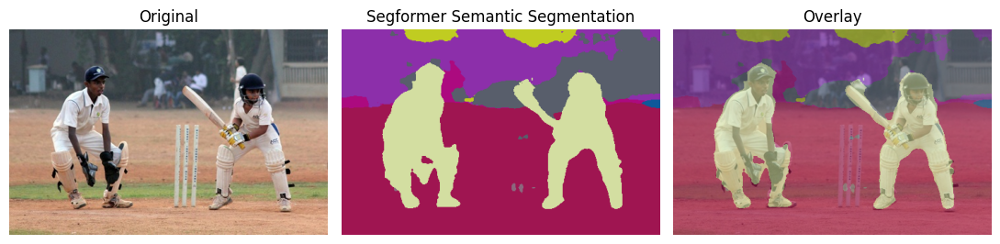

In [18]:
import torch
from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation
from PIL import Image
import numpy as np
import matplotlib.pylab as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#print(device)

# Load Semantic Model
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

def colorize(mask):
    if isinstance(mask, torch.Tensor):
        mask = mask.cpu().numpy()
    mask = mask.astype(np.int32)
    np.random.seed(0)
    colormap = np.random.randint(0, 255, (256, 3), dtype=np.uint8)
    return colormap[mask]

def run_segmentation(image_path):

    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)
    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    segmentation = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
    seg_color = colorize(segmentation)
    overlay = (0.4 * image_np + 0.6 * seg_color).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(11, 4))
    axes[0].imshow(image_np), axes[0].set_title("Original"), axes[0].axis("off")
    axes[1].imshow(seg_color), axes[1].set_title("Segformer Semantic Segmentation"), axes[1].axis("off")
    axes[2].imshow(overlay), axes[2].set_title("Overlay"), axes[2].axis("off")
    plt.tight_layout()
    plt.show()

run_segmentation("images/cricket.jpg")

#### **Pretrained SegFormer models from HuggingFace to segment Camvid, Cityscapes and ADE20k images**

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# DATASET CONFIG
# -----------------------------
datasets = {
    "ADE20K": {
        "model": "nvidia/segformer-b5-finetuned-ade-640-640",
        "image": "ade2.jpg"
    },
    "Cityscapes": {
        "model": "nvidia/segformer-b2-finetuned-cityscapes-1024-1024",
        "image": "cityscape2.png"
    },
    "CamVid": {
        "model": "nvidia/segformer-b2-finetuned-cityscapes-1024-1024",
        "image": "camvid.png"
    }
}

# -----------------------------
# DATASET COLOR PALETTES
# -----------------------------
cityscapes_palette = np.array([
    [128,64,128],[244,35,232],[70,70,70],[102,102,156],[190,153,153],
    [153,153,153],[250,170,30],[220,220,0],[107,142,35],[152,251,152],
    [70,130,180],[220,20,60],[255,0,0],[0,0,142],[0,0,70],
    [0,60,100],[0,80,100],[0,0,230],[119,11,32]
])

camvid_palette = np.array([
    [128,128,128],[128,0,0],[192,192,128],[128,64,128],[60,40,222],
    [128,128,0],[192,128,128],[64,64,128],[64,0,128],[64,64,0],
    [0,128,192],[0,0,0]
])

# ADE20K palette (simplified)
ade_palette = np.random.randint(0,255,(150,3))

# -----------------------------
# COLORIZE MASK
# -----------------------------
def colorize_mask(mask, palette):
    h, w = mask.shape
    color_mask = np.zeros((h,w,3), dtype=np.uint8)

    for label in range(len(palette)):
        color_mask[mask == label] = palette[label]

    return color_mask


# -----------------------------
# INFERENCE FUNCTION
# -----------------------------
def segment_image(image, model_name):

    processor = SegformerImageProcessor.from_pretrained(model_name)
    model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(DEVICE)

    inputs = processor(images=image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    logits = outputs.logits

    upsampled_logits = torch.nn.functional.interpolate(
        logits,
        size=image.size[::-1],
        mode="bilinear",
        align_corners=False
    )

    mask = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

    return mask


# -----------------------------
# VISUALIZATION
# -----------------------------
fig, axes = plt.subplots(3,3, figsize=(12,9))

for i,(dataset,info) in enumerate(datasets.items()):

    image = Image.open(info["image"]).convert("RGB")
    mask = segment_image(image, info["model"])

    # Select palette
    if dataset == "Cityscapes":
        palette = cityscapes_palette
    elif dataset == "CamVid":
        palette = camvid_palette
    else:
        palette = ade_palette

    color_mask = colorize_mask(mask, palette)

    overlay = np.array(image).copy()
    overlay = (0.5*overlay + 0.5*color_mask).astype(np.uint8)

    axes[i,0].imshow(image)
    axes[i,0].set_title(f"{dataset} Image")
    axes[i,0].axis("off")

    axes[i,1].imshow(color_mask)
    axes[i,1].set_title("Prediction")
    axes[i,1].axis("off")

    axes[i,2].imshow(overlay)
    axes[i,2].set_title("Overlay")
    axes[i,2].axis("off")

plt.tight_layout()
plt.show()

![](images/hf_segformer.png)

#### **3.4 Mask2Former**

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
import colorsys # Standard Python library for color conversion

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load Models (Standardizing on Mask2Former for all tasks)
sem_processor = Mask2FormerImageProcessor.from_pretrained("facebook/mask2former-swin-large-ade-semantic")
sem_model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-ade-semantic").to(device)

mask_processor = Mask2FormerImageProcessor.from_pretrained("facebook/mask2former-swin-large-coco-panoptic")
mask_model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-coco-panoptic").to(device)

def colorize(mask):
    """
    Assigns unique, vibrant, and highly discriminating colors to each ID.
    ID 0 is background (black).
    """
    if isinstance(mask, torch.Tensor):
        mask = mask.detach().cpu().numpy()
    
    h, w = mask.shape
    unique_ids = np.unique(mask)
    # Filter out background (0)
    ids_to_color = [i for i in unique_ids if i > 0] 
    num_instances = len(ids_to_color)    
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)    
    for i, obj_id in enumerate(ids_to_color):
        # 1. Distribute Hue evenly (0.0 to 1.0)
        # We use a golden ratio or prime jump to avoid adjacent IDs having similar colors
        hue = i / num_instances         
        # 2. Convert HSV to RGB (Saturation=1.0, Value=1.0 for maximum vibrancy)
        rgb = colorsys.hsv_to_rgb(hue, 1.0, 1.0)        
        # 3. Convert to 0-255 range
        vibrant_color = [int(c * 255) for c in rgb]        
        # 4. Apply to the specific ID
        color_mask[mask == obj_id] = vibrant_color
        
    return color_mask

def overlay(image, color_mask, mask_map=None, alpha=0.5):
    """
    Overlays color_mask on image. 
    If mask_map is provided, only pixels where mask_map > 0 are modified.
    """
    img_array = np.array(image).copy()
    color_mask = np.array(color_mask)
    
    if mask_map is not None:
        if isinstance(mask_map, torch.Tensor):
            mask_map = mask_map.detach().cpu().numpy()
        # Create a boolean index of where objects are
        is_object = mask_map > 0
        # Only blend where there is an object
        img_array[is_object] = (img_array[is_object] * (1 - alpha) + 
                                color_mask[is_object] * alpha).astype(np.uint8)
        return img_array
    else:
        # Standard global blending
        return (img_array * (1 - alpha) + color_mask * alpha).astype(np.uint8)

def segment_and_display(image_path):
    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)
    h, w = image_np.shape[:2]

    # 1️⃣ Semantic Segmentation
    inputs = sem_processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = sem_model(**inputs)
    sem_seg = sem_processor.post_process_semantic_segmentation(outputs, target_sizes=[(h, w)])[0]
    sem_color = colorize(sem_seg + 1) 
    sem_overlay = overlay(image, sem_color) # Global overlay for semantic

    # 2️⃣ Instance Segmentation (filter out "things")
    inputs_mask = mask_processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        mask_outputs = mask_model(**inputs_mask)    
    instance_result = mask_processor.post_process_instance_segmentation(mask_outputs, target_sizes=[(h, w)])[0]
    inst_map = np.zeros((h, w), dtype=np.int32)
    segmentation_tensor = instance_result["segmentation"].cpu().numpy()
    instance_counter = 1
    for res in instance_result["segments_info"]:
        # COCO "Person" label_id is 0. 
        # Most "thing" objects in COCO are IDs 0 through 79.
        # Background elements (stuff) in the panoptic model often start after 80.
        if res["label_id"] < 80: 
            mask_id = res["id"]
            binary_mask = (segmentation_tensor == mask_id)
            inst_map[binary_mask] = instance_counter 
            instance_counter += 1
    
    inst_color = colorize(inst_map)
    inst_overlay = overlay(image, inst_color, mask_map=inst_map, alpha=0.7)

    # 3️⃣ Panoptic Segmentation
    panoptic_result = mask_processor.post_process_panoptic_segmentation(mask_outputs, target_sizes=[(h, w)])[0]
    pan_map = panoptic_result["segmentation"].cpu().numpy()
    pan_color = colorize(pan_map)
    pan_overlay = overlay(image, pan_color) # Global overlay for panoptic

    # Visualization
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    titles = ["Original", "Semantic", "Instance", "Panoptic"]
    imgs = [image_np, sem_color, inst_color, pan_color]
    overlays = [None, sem_overlay, inst_overlay, pan_overlay]

    for i in range(4):
        axes[0, i].imshow(imgs[i])
        axes[0, i].set_title(titles[i])
        axes[0, i].axis("off")
        
        if overlays[i] is not None:
            axes[1, i].imshow(overlays[i])
            axes[1, i].set_title(f"{titles[i]} Overlay")
        else:
            axes[1, i].axis("off")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.savefig('images/out_sem_ins_pan.png')
    plt.close()

segment_and_display("images/men_beach.jpg")

![](images/out_sem_ins_pan.png)

#### **3.5 Segmenting Images from Cityscape and ADE20 Dataset with Pretrained OneFormer**

In [ ]:
#!pip install transformers torch pillow requests matplotlib -q
import numpy as np
import torch
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from io import BytesIO
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation

# ── Official Cityscapes 19-class train palette (trainId → RGB) ───────────────
# Source: github.com/mcordts/cityscapesScripts
CITYSCAPES_CLASSES = [
    "road", "sidewalk", "building", "wall", "fence", "pole",
    "traffic light", "traffic sign", "vegetation", "terrain", "sky",
    "person", "rider", "car", "truck", "bus", "train", "motorcycle", "bicycle"
]
CITYSCAPES_PALETTE = np.array([
    [128,  64, 128],   #  0 road
    [244,  35, 232],   #  1 sidewalk
    [ 70,  70,  70],   #  2 building
    [102, 102, 156],   #  3 wall
    [190, 153, 153],   #  4 fence
    [153, 153, 153],   #  5 pole
    [250, 170,  30],   #  6 traffic light
    [220, 220,   0],   #  7 traffic sign
    [107, 142,  35],   #  8 vegetation
    [152, 251, 152],   #  9 terrain
    [ 70, 130, 180],   # 10 sky
    [220,  20,  60],   # 11 person
    [255,   0,   0],   # 12 rider
    [  0,   0, 142],   # 13 car
    [  0,   0,  70],   # 14 truck
    [  0,  60, 100],   # 15 bus
    [  0,  80, 100],   # 16 train
    [  0,   0, 230],   # 17 motorcycle
    [119,  11,  32],   # 18 bicycle
], dtype=np.uint8)

# ── Official ADE20K 150-class palette ────────────────────────────────────────
# Source: MIT CSAIL / tensorflow deeplab colormap
def create_ade20k_palette():
    """Generates the official ADE20K 150-class color palette."""
    palette = np.zeros((150, 3), dtype=np.uint8)
    for idx in range(150):
        r, g, b, i = 0, 0, 0, idx
        for j in range(8):
            r |= ((i >> 0) & 1) << (7 - j)
            g |= ((i >> 1) & 1) << (7 - j)
            b |= ((i >> 2) & 1) << (7 - j)
            i >>= 3
        palette[idx] = [r, g, b]
    return palette

ADE20K_PALETTE = create_ade20k_palette()

# First 10 ADE20K class names for reference
ADE20K_CLASSES_SAMPLE = [
    "wall", "building", "sky", "floor", "tree", "ceiling",
    "road", "bed", "windowpane", "grass"
]

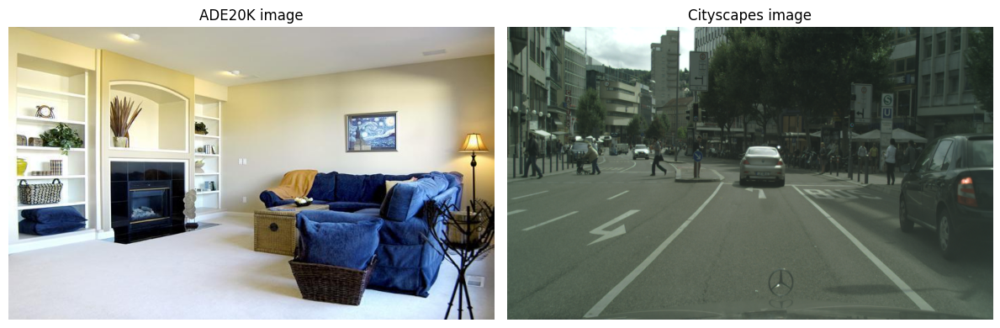

ADE20K     : (711, 471)
Cityscapes : (2048, 1024)


In [5]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

ade20k_image     = Image.open('images/ADE_val_00000519.png').convert('RGB')
cityscapes_image = Image.open('images/stuttgart_00_000000_000113_leftImg8bit.png').convert('RGB')

# Verify
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(ade20k_image, aspect='auto');     axes[0].set_title("ADE20K image");     axes[0].axis("off")
axes[1].imshow(cityscapes_image, aspect='auto'); axes[1].set_title("Cityscapes image"); axes[1].axis("off")
plt.tight_layout()
plt.show()
print(f"ADE20K     : {ade20k_image.size}")
print(f"Cityscapes : {cityscapes_image.size}")

In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"

ade_processor  = OneFormerProcessor.from_pretrained("shi-labs/oneformer_ade20k_swin_large")
ade_model      = OneFormerForUniversalSegmentation.from_pretrained("shi-labs/oneformer_ade20k_swin_large").to(device).eval()

city_processor = OneFormerProcessor.from_pretrained("shi-labs/oneformer_cityscapes_swin_large")
city_model     = OneFormerForUniversalSegmentation.from_pretrained("shi-labs/oneformer_cityscapes_swin_large").to(device).eval()

Loading weights:   0%|          | 0/826 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/826 [00:00<?, ?it/s]

In [17]:
def colorize_semantic(seg_map, palette):
    """Map class-id seg map → RGB using official palette."""
    h, w   = seg_map.shape
    color  = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id in np.unique(seg_map):
        if cls_id < len(palette):
            color[seg_map == cls_id] = palette[cls_id]
        else:
            # fallback for unknown ids
            np.random.seed(int(cls_id))
            color[seg_map == cls_id] = np.random.randint(0, 255, 3)
    return color

def run_inference(image, processor, model, palette, class_names):
    inputs = processor(image, [task], return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)

    size = [image.size[::-1]]  # (H, W)

    result      = processor.post_process_semantic_segmentation(outputs, target_sizes=size)[0]
    seg_map     = result.cpu().numpy()
    color_map   = colorize_semantic(seg_map, palette)
    # Build legend for detected classes
    legend = [
        mpatches.Patch(color=palette[i] / 255.0,
                       label=f"{class_names[i] if i < len(class_names) else i}")
        for i in np.unique(seg_map) if i < len(palette)
    ]

    overlay = (np.array(image.resize(color_map.shape[1::-1])) * 0.45
               + color_map * 0.55).clip(0, 255).astype(np.uint8)

    return color_map, overlay, legend

In [20]:
import matplotlib.patches as mpatches
from PIL import Image
from pathlib import Path
import torch

def segment_image(image, processor, model, palette, class_names, dataset_label, device):
    # ── Inference ──────────────────────────────────────────────────────
    inputs  = {k: v.to(device) for k, v in
               processor(image, ["semantic"], return_tensors="pt").items()}
    with torch.no_grad():
        seg_map = processor.post_process_semantic_segmentation(
                      model(**inputs), target_sizes=[image.size[::-1]]
                  )[0].cpu().numpy()

    # ── Colorize ───────────────────────────────────────────────────────
    color_map = palette[np.clip(seg_map, 0, len(palette) - 1)]
    overlay   = (np.array(image) * 0.45 + color_map * 0.55).clip(0, 255).astype(np.uint8)

    # ── Legend (detected classes sorted by coverage) ───────────────────
    legend = sorted([
        mpatches.Patch(color=palette[i] / 255.0,
                       label=f"{class_names[i]} ({(seg_map==i).mean()*100:.1f}%)")
        for i in np.unique(seg_map) if i < len(class_names)
    ], key=lambda p: float(p.get_label().split("(")[1].rstrip("%)")) , reverse=True)

    # ── Plot & save ────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(20, 7), gridspec_kw={"wspace": 0.04})
    for ax, img, title in zip(axes, [image, color_map, overlay],
                              ["Original", "Segmentation Map", "Overlay"]):
        ax.imshow(img); ax.set_title(title, fontsize=12); ax.axis("off")

    fig.legend(handles=legend, loc="lower center", ncol=min(6, len(legend)),
               fontsize=8, framealpha=0.85, bbox_to_anchor=(0.5, -0.02))
    fig.suptitle(f"{dataset_label} — {img_path.name}", fontsize=12, fontweight="bold", y=1.01)

    plt.show()

device = "cuda" if torch.cuda.is_available() else "cpu"

segment_image(ade20k_image, 
    processor     = ade_processor,
    model         = ade_model,
    palette       = ADE20K_PALETTE,
    class_names   = list(ade_model.config.id2label.values()),
    dataset_label = "ADE20K",
    device        = device)

segment_image(cityscapes_image, 
    processor     = city_processor,
    model         = city_model,
    palette       = CITYSCAPES_PALETTE,
    class_names   = CITYSCAPES_CLASSES,
    dataset_label = "Cityscapes",
    device        = device)

![](images/segmented_ADE_val_00000519.png)
![](images/seg_ade20k.gif)

In [ ]:
segment_image(cityscapes_image, 
    processor     = city_processor,
    model         = city_model,
    palette       = CITYSCAPES_PALETTE,
    class_names   = CITYSCAPES_CLASSES,
    dataset_label = "Cityscapes",
    device        = device
)\

![](images/segmented_stuttgart_00_000000_000113_leftImg8bit.png)
![](images/seg_cityscapes.gif)

## Further reading

1. http://scikit-image.org/docs/dev/user_guide/tutorial_segmentation.html
2. https://www.scipy-lectures.org/packages/scikit-image/index.html
3. http://scikit-image.org/docs/dev/auto_examples/
4. https://web.stanford.edu/class/ee368/Handouts/Lectures/2014_Spring/Combined_Slides/6-Image-Segmentation-Combined.pdf
5. https://courses.csail.mit.edu/6.869/lectnotes/lect19/lect19-slides-6up.pdf
6. http://cmm.ensmp.fr/~beucher/publi/WTS_residues.pdf
7. http://cmm.ensmp.fr/~beucher/wtshed.html
8. https://sandipanweb.wordpress.com/2018/02/25/graph-based-imagesegmentation-in-python/
9. https://sandipanweb.wordpress.com/2018/02/11/interactive-imagesegmentation-with-graph-cut/
10. http://people.cs.uchicago.edu/~pff/papers/seg-ijcv.pdf
11. http://www.kev-smith.com/papers/SMITH_TPAMI12.pdf
12. https://youtu.be/RL4VxB-Vjhs